# Yoordata Proyecto Final Jaime Bloch

## Importamos las librerías necesaria

In [3]:
from zipfile import ZipFile

import os
import pandas as pd
import numpy as np

import json

import folium
import folium.plugins
from folium.plugins import HeatMapWithTime as HMWT
from folium.plugins import HeatMap as HM
from folium.plugins import MarkerCluster


import requests as req
import xmltojson


from bs4 import BeautifulSoup as bs
#!pip install python-vlc

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import chart_studio.plotly as py
import cufflinks as cf
cf.go_offline()

from ipywidgets import interact

from pyquery import PyQuery

from wordcloud import WordCloud


import streamlit as st
from streamlit_folium import folium_static
import folium

!pip install streamlit
!pip install -U kaleido
!pip install utils
!pip install xmltojson
!pip install pyquery
!pip install streamlit-folium

Defaulting to user installation because normal site-packages is not writeable


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


## Vemos los archivos que hay en la carpeta

In [4]:
archivos = os.listdir()
archivos

['.git',
 'takeout-20210614T071504Z-001.zip',
 'mando.png',
 'takeout-20210614T071504Z-002.zip',
 'takeout-20210614T071504Z-004.zip',
 'takeout-20210614T071504Z-005.zip',
 'Esquema.docx',
 'README.md',
 'takeout-20210614T071504Z-003.zip',
 'yoordata.py',
 '.~lock.Esquema.docx#',
 'Takeout',
 '.ipynb_checkpoints',
 'dp-cache',
 'ProyectoFinal.ipynb',
 '.gitignore']

## Extraemos todos los archivos de los zip

In [5]:
archivos_zip = []
for i in archivos:
    if i.endswith(".zip"):
        archivos_zip.append(i)

In [6]:
archivos_zip
    

['takeout-20210614T071504Z-001.zip',
 'takeout-20210614T071504Z-002.zip',
 'takeout-20210614T071504Z-004.zip',
 'takeout-20210614T071504Z-005.zip',
 'takeout-20210614T071504Z-003.zip']

In [7]:
cwd = os.getcwd()  #guardamos el directorio del proyecto

In [8]:
'''for i in archivos_zip:
    zf = ZipFile(i)
    zf.extractall()'''

'for i in archivos_zip:\n    zf = ZipFile(i)\n    zf.extractall()'

In [9]:
os.chdir(cwd + '/' + 'Takeout') #guardamos el directorio de la carpeta Takeout con la que trabajaremos

In [10]:
Takeout_dir = os.getcwd() #guardamos el directorio de la carpeta Takeout con la que trabajaremos

In [11]:
Takeout_dir

'/home/jbloch3/Documents/Proyecto_Final/Takeout'

In [12]:
os.listdir() #Comprobamos que está todo

['Google Fotos',
 'Chrome',
 'Search Contributions',
 'Google\xa0Pay',
 'Tareas',
 'Correo',
 'Cloud Print',
 'YTcanales.png',
 'Save',
 'Google Shopping',
 'Drive',
 'TopUrl.png',
 'Keep',
 'juegos.jpg',
 'Hangouts',
 'Servicio de configuración de dispositivo Android',
 'Classroom',
 'archive_browser.html',
 'paginas.jpg',
 'Grupos',
 'Google Play Libros',
 'Blogger',
 'Google\xa0My\xa0Business',
 'wordcloud.png',
 'Historial de ubicaciones',
 'Mi actividad',
 'Calendar',
 'Cuenta de Google',
 'Perfil',
 'Google Workspace Marketplace',
 'Contactos',
 'YouTube y YouTube Music',
 'Noticias',
 'Servicios de Juegos de Google Play',
 'Google Play Store',
 'Google Play Películas',
 'Maps',
 'Aplicación Home',
 'Maps (Tus sitios)']

## Extraemos el nombre y mail de la carpeta perfil

In [13]:


f = open(Takeout_dir + '/' + 'Perfil' +'/'+'Perfil.json')
f

<_io.TextIOWrapper name='/home/jbloch3/Documents/Proyecto_Final/Takeout/Perfil/Perfil.json' mode='r' encoding='UTF-8'>

In [14]:
perfil_json = json.load(f)
perfil_json

{'name': {'givenName': 'Jaime',
  'familyName': 'Bloch',
  'formattedName': 'Jaime Bloch'},
 'displayName': 'Jaime Bloch',
 'emails': [{'value': 'jaimebloch3@gmail.com'}],
 'gender': {'type': 'male'}}

In [13]:
nombre = perfil_json['name']['formattedName']
nombre

'Jaime Bloch'

In [14]:
perfil_json

{'name': {'givenName': 'Jaime',
  'familyName': 'Bloch',
  'formattedName': 'Jaime Bloch'},
 'displayName': 'Jaime Bloch',
 'emails': [{'value': 'jaimebloch3@gmail.com'}],
 'gender': {'type': 'male'}}

In [15]:
email = perfil_json['emails'][0]['value']

## Extraemos las páginas web visitadas

In [15]:
c = open(Takeout_dir + '/' + 'Chrome' +'/'+'BrowserHistory.json')
c

<_io.TextIOWrapper name='/home/jbloch3/Documents/Proyecto_Final/Takeout/Chrome/BrowserHistory.json' mode='r' encoding='UTF-8'>

In [16]:
chrome_json = json.load(c)
chrome_json

{'Browser History': [{'page_transition': 'LINK',
   'title': 'Crear copias de seguridad o restaurar datos de un dispositivo Android - Ayuda de Android',
   'url': 'https://support.google.com/android/answer/2819582',
   'client_id': '0SESb8veQj7X9JFV6Fnp6A==',
   'time_usec': 1617015635501573},
  {'page_transition': 'LINK',
   'title': 'Subir archivos y carpetas a Google Drive - Android - Ayuda de Google Drive',
   'url': 'https://support.google.com/drive/answer/2424368',
   'client_id': '0SESb8veQj7X9JFV6Fnp6A==',
   'time_usec': 1617015621139135},
  {'page_transition': 'LINK',
   'title': 'Crear copias de seguridad o restaurar datos de un dispositivo Android - Ayuda de Android',
   'url': 'https://support.google.com/android/answer/2819582',
   'client_id': '0SESb8veQj7X9JFV6Fnp6A==',
   'time_usec': 1617015603326052},
  {'page_transition': 'LINK',
   'title': 'Cambiar a un teléfono Android nuevo - Ayuda de Android',
   'url': 'https://support.google.com/android/answer/6193424?hl=es',


In [17]:
df = pd.DataFrame(chrome_json['Browser History'])
df

,page_transition,title,url,client_id,time_usec
0,LINK,Crear copias de seguridad o restaurar datos de...,https://support.google.com/android/answer/2819582,0SESb8veQj7X9JFV6Fnp6A==,1617015635501573
1,LINK,Subir archivos y carpetas a Google Drive - And...,https://support.google.com/drive/answer/2424368,0SESb8veQj7X9JFV6Fnp6A==,1617015621139135
2,LINK,Crear copias de seguridad o restaurar datos de...,https://support.google.com/android/answer/2819582,0SESb8veQj7X9JFV6Fnp6A==,1617015603326052
3,LINK,Cambiar a un teléfono Android nuevo - Ayuda de...,https://support.google.com/android/answer/6193...,0SESb8veQj7X9JFV6Fnp6A==,1617015577679577
4,LINK,Galaxy S6 32 Gb - Negro - Libre Reacondicionad...,https://www.backmarket.es/samsung-galaxy-s6-32...,0SESb8veQj7X9JFV6Fnp6A==,1617015289989430
...,...,...,...,...,...
5518,LINK,"Casa nueva, vida nueva - AS.com",https://as.com/futbol/2020/06/13/primera/15920...,bctKwz78FXl554STSm+iNQ==,1592153555352896
5519,LINK,Real Madrid - Eibar en directo: LaLiga Santand...,https://as.com/futbol/2020/06/14/primera/15921...,bctKwz78FXl554STSm+iNQ==,1592153544419827
5520,LINK,"AS.com - Diario online deportivo. Fútbol, moto...",https://as.com/,bctKwz78FXl554STSm+iNQ==,1592153536799179
5521,LINK,La construcción de una mentira: del 11M al 8M,https://m.eldiario.es/politica/construccion-me...,bctKwz78FXl554STSm+iNQ==,1592133976871184


In [19]:
df.url.tail #Comprobamos que todass están entre '//' y '/'


<bound method NDFrame.tail of 0       https://support.google.com/android/answer/2819582
1         https://support.google.com/drive/answer/2424368
2       https://support.google.com/android/answer/2819582
3       https://support.google.com/android/answer/6193...
4       https://www.backmarket.es/samsung-galaxy-s6-32...
                              ...                        
5518    https://as.com/futbol/2020/06/13/primera/15920...
5519    https://as.com/futbol/2020/06/14/primera/15921...
5520                                      https://as.com/
5521    https://m.eldiario.es/politica/construccion-me...
5522                               https://m.eldiario.es/
Name: url, Length: 5523, dtype: object>

### Limpiamos

In [20]:
for i in range(len(df.url)):
    if '//' in df.url[i]:
        df.url[i] = df.url[i].split('//')[1]
        


In [21]:
for i in range(len(df.url)):
    if '/' in df.url[i]:
        df.url[i] = df.url[i].split('/')[0]

In [22]:
set(df.url)

{'9gag.com',
 'about:blank',
 'accounts.google.com',
 'accounts2.tplinkcloud.com',
 'aenfismadridpenagrande.com',
 'altadex.com',
 'ammos.es',
 'amp-20minutos-es.cdn.ampproject.org',
 'amp-cinemablend-com.cdn.ampproject.org',
 'amp-diariogol-com.cdn.ampproject.org',
 'amp-economiadigital-es.cdn.ampproject.org',
 'amp-elmundo-es.cdn.ampproject.org',
 'amp-elperiodico-com.cdn.ampproject.org',
 'amp-europapress-es.cdn.ampproject.org',
 'amp-heraldo-es.cdn.ampproject.org',
 'amp-jsonline-com.cdn.ampproject.org',
 'amp-laopiniondemalaga-es.cdn.ampproject.org',
 'amp-lasexta-com.cdn.ampproject.org',
 'amp-lne-es.cdn.ampproject.org',
 'amp-marca-com.cdn.ampproject.org',
 'amp-milenio-com.cdn.ampproject.org',
 'amp-reddit-com.cdn.ampproject.org',
 'amp-rtve-es.cdn.ampproject.org',
 'amp-ultimahora-es.cdn.ampproject.org',
 'amp.20minutos.es',
 'andro4all-com.cdn.ampproject.org',
 'android-upd.xyz',
 'anewspost.com',
 'answers.ea.com',
 'answers.microsoft.com',
 'apnews.com',
 'ar.pinterest.com'

In [23]:
Top10URL = df.url.value_counts()[0:10] # Vemos la cantidad de veces que hemos visitado cada pagina y sacamos el Top 10
Top10URL

as.com                2189
www.eldiario.es        515
www.google.com         317
mobile.twitter.com     137
www.pinterest.es       109
aulavirtual.um.es       91
resultados.as.com       87
www.soolide.com         84
www.xvideos.com         68
es.m.wikipedia.org      53
Name: url, dtype: int64

### Transformamos a DF para poder sacar la visualización

In [25]:
Top10URL_df = pd.DataFrame(Top10URL)
Top10URL_df 

,url
as.com,2189
www.eldiario.es,515
www.google.com,317
mobile.twitter.com,137
www.pinterest.es,109
aulavirtual.um.es,91
resultados.as.com,87
www.soolide.com,84
www.xvideos.com,68
es.m.wikipedia.org,53


In [26]:
Top10URL_df_i= Top10URL_df.reset_index()

Top10URL_df_i = Top10URL_df_i.rename(columns={'index': 'Página', 'url': 'Visitas'})
Top10URL_df_i

,Página,Visitas
0,as.com,2189
1,www.eldiario.es,515
2,www.google.com,317
3,mobile.twitter.com,137
4,www.pinterest.es,109
5,aulavirtual.um.es,91
6,resultados.as.com,87
7,www.soolide.com,84
8,www.xvideos.com,68
9,es.m.wikipedia.org,53


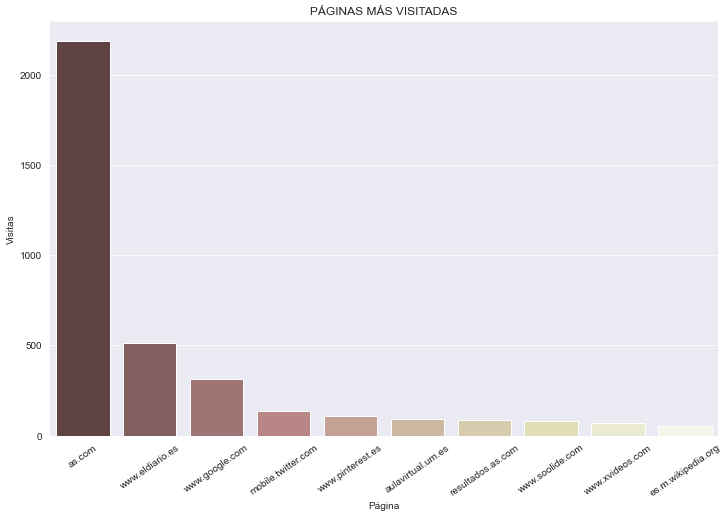

In [27]:
plt.figure(figsize=(10, 7))
sns.set_style("darkgrid")
TopUrl = sns.barplot(data=Top10URL_df_i, x=Top10URL_df_i['Página'], y=Top10URL_df_i.Visitas, palette='pink').set_title('PÁGINAS MÁS VISITADAS')
plt.xticks(rotation=35)

plt.tight_layout(pad=0)

plt.savefig("TopUrl.png")

In [28]:
fig = Top10URL.iplot(kind='bar', xTitle='Country', title='Páginas más visitadas') # Este gráfico no lo usaremos



## Hacemos una nuve de las páginas 

In [29]:
df['sopa'] = df.url.apply(lambda x: x.replace('com', '').replace('www', '').replace('es', '')
                           .replace('org', '').strip())

In [30]:
nadena = ['noapnc', 'oainnaci']

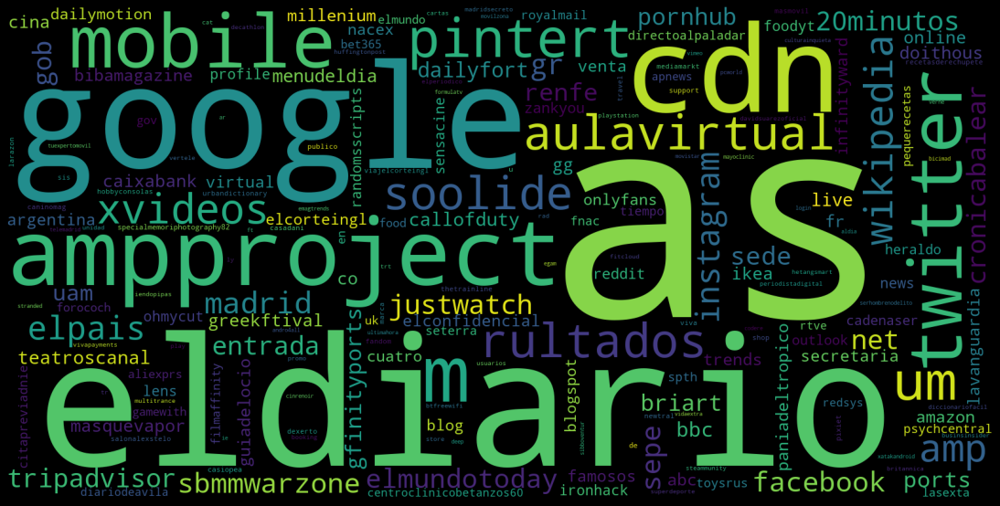

In [31]:
wordcloud = WordCloud(width=1600,height=800, stopwords=nadena, repeat= False, collocations=False).generate(' '.join([e for e in df.sopa]))

plt.figure(figsize=(15, 10), facecolor='k')
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.savefig('paginas.jpg', facecolor='k', bbox_inches='tight')

## Hacemos una nuve de las páginas 

In [32]:
os. chdir('Servicios de Juegos de Google Play/Juegos/')#cd Servicios de Juegos de Google Play/Juegos/

In [33]:
ls

'Best Sniper Legacy_ Dino Hunt'/  'Jet Run_ City Defender'/
'CATS_ Crash Arena Turbo Stars'/  'Linebound - Life On The Line'/
'Cooking Fever'/                  'Madrid Zombi'/
'DEAD TARGET_ Zombie Shooting'/   'Red Ball 4'/
'Google Play Games'/              'Warlings_ Armageddon'/
'Hero Wars'/


In [34]:
juegos = os.listdir()
juegos

['Jet Run_ City Defender',
 'Red Ball 4',
 'Madrid Zombi',
 'DEAD TARGET_ Zombie Shooting',
 'Google Play Games',
 'Linebound - Life On The Line',
 'CATS_ Crash Arena Turbo Stars',
 'Warlings_ Armageddon',
 'Hero Wars',
 'Cooking Fever',
 'Best Sniper Legacy_ Dino Hunt']

In [35]:
juegos_df = pd.DataFrame(juegos)
juegos_df
juegos_df['limpio'] = juegos_df.apply(lambda x: x.replace(' ', '_'))
juegos_df['limpio'] = juegos_df['limpio'].apply(lambda x: x.replace(' ', '_'))
juegos_df

,0,limpio
0,Jet Run_ City Defender,Jet_Run__City_Defender
1,Red Ball 4,Red_Ball_4
2,Madrid Zombi,Madrid_Zombi
3,DEAD TARGET_ Zombie Shooting,DEAD_TARGET__Zombie_Shooting
4,Google Play Games,Google_Play_Games
5,Linebound - Life On The Line,Linebound_-_Life_On_The_Line
6,CATS_ Crash Arena Turbo Stars,CATS__Crash_Arena_Turbo_Stars
7,Warlings_ Armageddon,Warlings__Armageddon
8,Hero Wars,Hero_Wars
9,Cooking Fever,Cooking_Fever


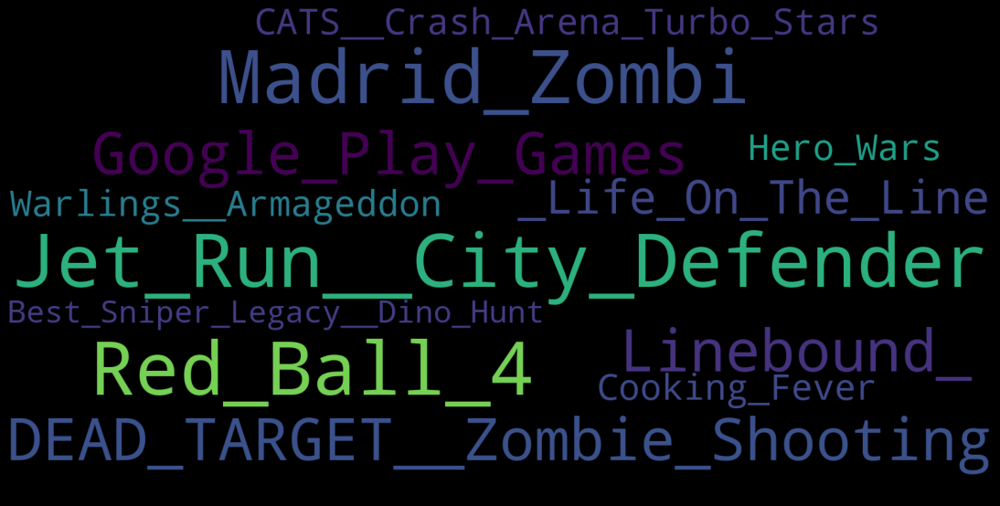

In [36]:
wordcloud = WordCloud(width=1600,height=800, stopwords=nadena, repeat= False, collocations=False).generate(' '.join([e for e in juegos_df['limpio']]))

plt.figure(figsize=(15, 10), facecolor='k')
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.savefig('juegos.jpg', facecolor='k', bbox_inches='tight')


## Preparamos las reseñas extrayendo lat y long para visualizarlo en un mapa

In [37]:
os. chdir(Takeout_dir)

In [38]:
r = open(Takeout_dir + '/' + 'Maps (Tus sitios)' +'/'+'Reseñas.json')

In [39]:
reseñas_json = json.load(r)

In [40]:
reseñas_json["features"]

[{'geometry': {'coordinates': [-3.6738487, 40.4248464], 'type': 'Point'},
  'properties': {'Google Maps URL': 'https://www.google.com/maps/place//data=!4m2!3m1!1s0x0:0x5d92102d0ed91be8',
   'Location': {'Address': 'Calle de Goya, 99 escalera A, 1D, 28009 Madrid, España',
    'Business Name': 'Instituto Dental Espinassi & Happy Smile Clinic',
    'Country Code': 'ES',
    'Geo Coordinates': {'Latitude': '40.4248464', 'Longitude': '-3.6738487'}},
   'Published': '2021-05-27T14:18:47.943834Z',
   'Review Comment': 'Una experiencia estupenda. El sitio está muy bien, me trataron genial y el tratamiento de blancamiento es super efectivo. Muy recomendable :)',
   'Star Rating': 5},
  'type': 'Feature'},
 {'geometry': {'coordinates': [-3.7040303, 40.426999], 'type': 'Point'},
  'properties': {'Google Maps URL': 'https://www.google.com/maps/place//data=!4m2!3m1!1s0x0:0x78bf2642005218b1',
   'Location': {'Address': 'Plaza del Dos de Mayo, 28004 Madrid, España',
    'Business Name': 'Plaza del Do

In [41]:
df_reseñas = pd.DataFrame(reseñas_json["features"])
df_reseñas

,geometry,properties,type
0,"{'coordinates': [-3.6738487, 40.4248464], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
1,"{'coordinates': [-3.7040303, 40.426999], 'type...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
2,"{'coordinates': [-3.708749, 40.416807], 'type'...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
3,"{'coordinates': [-3.7026066, 40.4313091], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
4,"{'coordinates': [23.728162, 37.9654788], 'type...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
5,"{'coordinates': [-3.59055, 40.4621018], 'type'...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
6,"{'coordinates': [-3.701479, 40.40255], 'type':...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
7,"{'coordinates': [-3.6882448, 40.4257422], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
8,"{'coordinates': [-3.7011585, 40.4294192], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
9,"{'coordinates': [-3.7094052, 40.4205735], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature


In [42]:
df_reseñas1 = pd.json_normalize(df_reseñas['properties'])
df_reseñas1.dtypes

Google Maps URL                       object
Published                             object
Review Comment                        object
Star Rating                            int64
Location.Address                      object
Location.Business Name                object
Location.Country Code                 object
Location.Geo Coordinates.Latitude     object
Location.Geo Coordinates.Longitude    object
dtype: object

In [43]:
df_reseñas1["Location.Geo Coordinates.Latitude"] = pd.to_numeric(df_reseñas1["Location.Geo Coordinates.Latitude"], downcast="float")
df_reseñas1['Location.Geo Coordinates.Longitude'] = pd.to_numeric(df_reseñas1['Location.Geo Coordinates.Longitude'], downcast="float")
df_reseñas1[:10]

,Google Maps URL,Published,Review Comment,Star Rating,Location.Address,Location.Business Name,Location.Country Code,Location.Geo Coordinates.Latitude,Location.Geo Coordinates.Longitude
0,https://www.google.com/maps/place//data=!4m2!3...,2021-05-27T14:18:47.943834Z,Una experiencia estupenda. El sitio está muy b...,5,"Calle de Goya, 99 escalera A, 1D, 28009 Madrid...",Instituto Dental Espinassi & Happy Smile Clinic,ES,40.424847,-3.673849
1,https://www.google.com/maps/place//data=!4m2!3...,2021-02-14T12:08:37.717870Z,NaN,5,"Plaza del Dos de Mayo, 28004 Madrid, España",Plaza del Dos de Mayo,ES,40.426998,-3.704030
2,https://www.google.com/maps/place//data=!4m2!3...,2020-12-14T04:10:40.835201Z,NaN,5,"Calle de las Fuentes, 1, 28013 Madrid, España",Ramen Kagura Ópera,ES,40.416805,-3.708749
3,https://www.google.com/maps/place//data=!4m2!3...,2020-12-03T11:15:50.821144Z,Cocina de autor buenísima y super barata! Me e...,5,"Calle de Alburquerque, 5, 28010 Madrid, España",Moti e Vi,ES,40.431309,-3.702607
4,https://www.google.com/maps/place//data=!4m2!3...,2020-08-07T12:35:17.480014Z,Horrible experiencia. Nos hicieron pagar un se...,1,"Leof. Andrea Siggrou 49, Athina 117 43, Grecia",Europcar,GR,37.965477,23.728163
5,https://www.google.com/maps/place//data=!4m2!3...,2020-07-12T14:25:06.184531Z,Delicioso! Tienen mi cerveza favorita de barri...,5,"Av. de Logroño, 205, 28042 Madrid, España",La Caña de Gonzalo,ES,40.462101,-3.590550
6,https://www.google.com/maps/place//data=!4m2!3...,2020-01-21T19:14:14.092122Z,NaN,5,"Calle de Martín de Vargas, 23, 28005 Madrid, E...",GRUPO CDM (Madrid),NaN,40.402550,-3.701479
7,https://www.google.com/maps/place//data=!4m2!3...,2020-01-08T17:11:38.363955Z,NaN,2,"Calle de Goya, 11, 28001 Madrid, España",Cafe & Tapas,ES,40.425743,-3.688245
8,https://www.google.com/maps/place//data=!4m2!3...,2019-02-09T18:24:40.423019Z,NaN,1,"Calle de Luchana, 6, 28010 Madrid, España",LA CHOCITA SA,ES,40.429420,-3.701159
9,https://www.google.com/maps/place//data=!4m2!3...,2019-01-13T13:57:58.404336Z,Muy recomendable. Tienen un plato q se llama b...,5,"Calle de la Bola, 12, 28013 Madrid, España",A Ri Rang,ES,40.420574,-3.709405


In [44]:
media_reseñas = df_reseñas1['Star Rating'].mean() # Calculamos la media de tus valoraciones

In [45]:
media_reseñas

4.0

In [46]:
df_reseñas1.ubica=df_reseñas1[['Location.Geo Coordinates.Latitude', 'Location.Geo Coordinates.Longitude']].values
df_reseñas1.ubica

<ipython-input-46-2bcb6d4c3d76>:1: UserWarning:

Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access



array([[40.424847 , -3.6738486],
       [40.427    , -3.7040303],
       [40.416805 , -3.708749 ],
       [40.43131  , -3.7026067],
       [37.965477 , 23.728163 ],
       [40.4621   , -3.59055  ],
       [40.40255  , -3.701479 ],
       [40.425743 , -3.6882448],
       [40.42942  , -3.7011585],
       [40.420574 , -3.7094052],
       [40.442024 , -3.7130878],
       [40.48047  , -3.7166018]], dtype=float32)

In [47]:
m = folium.Map(location=df_reseñas1.ubica[0], zoom_start=12, tiles="Stamen Terrain")
colores = {1:'red', 2:'orange', 3:'yellow', 4:'darkgreen', 5:'green' }
for i in range(len(df_reseñas1)):
    folium.Marker(
        location= [df_reseñas1.ubica[i][0], df_reseñas1.ubica[i][1]],
        popup=df_reseñas1['Location.Business Name'][i] +' (' + str(df_reseñas1['Star Rating'][i]) + ')',
        icon=folium.Icon(color=colores[df_reseñas1['Star Rating'][i]], icon='check', prefix='fa'),
    ).add_to(m)


m



## Obtenemos la lista de libros 

In [48]:
os. chdir('Google Play Libros')
libros = os.listdir()
os. chdir(Takeout_dir)

In [49]:
libros

['Don Quijote de la Mancha', 'La Celestina']

## Obtenemos las valoraciones de las películas 

In [50]:
p = open(Takeout_dir + '/' + 'Google Play Películas' +'/'+'Puntuaciones.json')

In [51]:
peliculas_json = json.load(p)

In [52]:
peliculas_json

{'ratings': [{'title': 'Dumbo (Doblaje clásico)', 'rating': 'No me gusta'},
  {'title': 'Dumbo', 'rating': 'No me gusta'}]}

In [53]:
df_peliculas = pd.DataFrame(peliculas_json['ratings'])
df_peliculas


,title,rating
0,Dumbo (Doblaje clásico),No me gusta
1,Dumbo,No me gusta


## Sacamos del html los últimos videos vistos de Youtube

In [54]:

html = open(Takeout_dir + '/YouTube y YouTube Music/historial/historial-de-reproducciones.html', 'r').read() # local html

query = PyQuery(html)
lst= []
for i in range(2000):
    try:
        lst.append(query("a").eq(i).text())
    except: 
        break

In [55]:
youtube = pd.DataFrame(lst)
youtube
youtube[0] = youtube[0].apply(lambda x: x.replace(' ', '_').replace('com', '').replace('www', '').replace('es', '')
                           .replace('org', '').replace('https', '').strip())
youtube

,0
0,Informativo_matinal_exprs_(14/06/21)
1,Soloedia
2,Order_Delivery_on_Uber_Eats_|_Uber_Eats
3,Hola_Isabella_:D
4,El_Rabos
...,...
1995,Skills421
1996,"Linux_&_Windows,_Instalación_Dual_Boot"
1997,Fazt
1998,¿Qué__Linux?


In [56]:
canales = youtube.value_counts()[0:10]  #Obtenemos el top 10
canales

La_Ristencia_en_Movistar+    74
Cloakzy                      72
Soloedia                     34
Symfuhny                     33
BennyCentral                 28
Aydan                        22
Mundo_Maldini                20
Inmagic                      19
I_Love_Golfing               18
Peter_DelaG                  16
dtype: int64

In [57]:
TopCanales_df = pd.DataFrame(canales, columns= ['Visitas'])
TopCanales_df_i= TopCanales_df.reset_index()
TopCanales_df_i

,0,Visitas
0,La_Ristencia_en_Movistar+,74
1,Cloakzy,72
2,Soloedia,34
3,Symfuhny,33
4,BennyCentral,28
5,Aydan,22
6,Mundo_Maldini,20
7,Inmagic,19
8,I_Love_Golfing,18
9,Peter_DelaG,16


In [58]:


TopCanales_df_i = TopCanales_df_i.rename(columns={0: 'Canal'})
TopCanales_df_i

,Canal,Visitas
0,La_Ristencia_en_Movistar+,74
1,Cloakzy,72
2,Soloedia,34
3,Symfuhny,33
4,BennyCentral,28
5,Aydan,22
6,Mundo_Maldini,20
7,Inmagic,19
8,I_Love_Golfing,18
9,Peter_DelaG,16


### Ploteamos los videos de Youtube

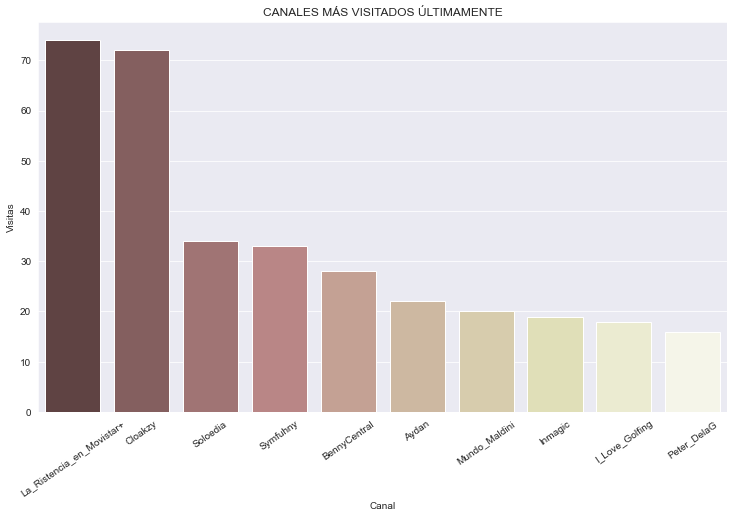

In [59]:
plt.figure(figsize=(10, 7))
sns.set_style("darkgrid")
YTcanales = sns.barplot(data=Top10URL_df_i, x=TopCanales_df_i['Canal'], y=TopCanales_df_i.Visitas, palette='pink').set_title('CANALES MÁS VISITADOS ÚLTIMAMENTE')
plt.xticks(rotation=35)

plt.tight_layout(pad=0)

plt.savefig("YTcanales.png")

In [60]:
canales.iplot(kind='bar', xTitle='Canales Youtube', title='Canales de Youtube más visitados (Últimos 1000)')
#Este no lo usaremos

## Obtenemos varios audios aleatorio 

In [61]:
os.chdir(Takeout_dir + '/' + 'Mi actividad' +'/'+'Voz y Audio')

In [62]:
audios = os.listdir()

In [63]:
os.chdir(Takeout_dir)

In [64]:
len(audios)

974

In [ ]:
ind1 = np.random.randint(0,len(audios)) #Indices aleatorios para sacar audios aleatorios 
ind2 = np.random.randint(0,len(audios))
ind3 = np.random.randint(0,len(audios))

In [65]:
ind = np.random.randint(0,len(audios))
import vlc
p = vlc.MediaPlayer(Takeout_dir + '/' + 'Mi actividad' +'/'+'Voz y Audio' + '/'+ audios[ind])
p.play()

0

In [80]:
import vlc
p = vlc.MediaPlayer(Takeout_dir + '/' + 'Mi actividad' +'/'+'Voz y Audio' + '/'+ audios[ind])
p.play()

0

In [66]:
os.chdir(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History')

In [67]:
años = os.listdir()

328

{'latitudeE7': 404441923,
 'longitudeE7': -36987280,
 'placeId': 'ChIJFQpO7_koQg0R0iwzvgVTf3E',
 'address': 'Calle de Ponzano, 76\n28003 Madrid\nEspaña',
 'name': 'Picsa',
 'sourceInfo': {'deviceTag': 773610100},
 'locationConfidence': 99.99132}

,activitySegment,placeVisit
0,"{'startLocation': {'latitudeE7': 404234350, 'l...",NaN
1,NaN,"{'location': {'latitudeE7': 404441923, 'longit..."
2,"{'startLocation': {'latitudeE7': 404441923, 'l...",NaN
3,NaN,"{'location': {'latitudeE7': 404450648, 'longit..."
4,"{'startLocation': {'latitudeE7': 404450648, 'l...",NaN
...,...,...
323,NaN,"{'location': {'latitudeE7': 404264938, 'longit..."
324,"{'startLocation': {'latitudeE7': 404264938, 'l...",NaN
325,NaN,"{'location': {'latitudeE7': 404245942, 'longit..."
326,"{'startLocation': {'latitudeE7': 404245942, 'l...",NaN


In [72]:
años

['2021', '2019', '2015', '2020', '2017', '2016', '2018']

In [73]:
os.chdir(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History/')

In [74]:
años = os.listdir()

In [75]:
años

['2021', '2019', '2015', '2020', '2017', '2016', '2018']

In [81]:
lst= []
for i in años:
    os.chdir(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History/' + i)
    meses = os.listdir()   
    for j in meses:
        x = open(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History/'+i+'/'+ j)
        prueba_json = json.load(x)
        for k in range(len(prueba_json['timelineObjects'])):
            try:
                lst.append((prueba_json['timelineObjects'][k]['placeVisit']['location']['latitudeE7'], prueba_json['timelineObjects'][k]['placeVisit']['location']['longitudeE7'], j))
            except:
                pass

In [82]:
df_loc = pd.DataFrame(lst, columns = ['lat', 'lon', 'date'])
df_loc['lat'] = df_loc['lat'].apply(lambda x: x / 10000000)
df_loc['lon'] = df_loc['lon'].apply(lambda x: x / 10000000)
df_loc


,lat,lon,date
0,40.424598,-3.694529,2021_MARCH.json
1,40.426408,-3.681290,2021_MARCH.json
2,40.507266,-3.695639,2021_MARCH.json
3,40.458311,-3.689925,2021_MARCH.json
4,40.427784,-3.695924,2021_MARCH.json
...,...,...,...
5423,40.426408,-3.681290,2018_JULY.json
5424,40.424583,-3.694809,2018_JULY.json
5425,40.434545,-3.708371,2018_JULY.json
5426,40.429750,-3.705743,2018_JULY.json


In [83]:
df_loc['date'] = df_loc['date'].apply(lambda x: x.replace('_',' ').replace('.json', ''))
df_loc                                      

,lat,lon,date
0,40.424598,-3.694529,2021 MARCH
1,40.426408,-3.681290,2021 MARCH
2,40.507266,-3.695639,2021 MARCH
3,40.458311,-3.689925,2021 MARCH
4,40.427784,-3.695924,2021 MARCH
...,...,...,...
5423,40.426408,-3.681290,2018 JULY
5424,40.424583,-3.694809,2018 JULY
5425,40.434545,-3.708371,2018 JULY
5426,40.429750,-3.705743,2018 JULY


In [84]:
df_loc['date'] = pd.to_datetime(df_loc['date'])
df_loc['month']=df_loc['date'].apply(lambda x: x.month)
df_loc['year']=df_loc['date'].apply(lambda x: x.year)
df_loc

,lat,lon,date,month,year
0,40.424598,-3.694529,2021-03-01,3,2021
1,40.426408,-3.681290,2021-03-01,3,2021
2,40.507266,-3.695639,2021-03-01,3,2021
3,40.458311,-3.689925,2021-03-01,3,2021
4,40.427784,-3.695924,2021-03-01,3,2021
...,...,...,...,...,...
5423,40.426408,-3.681290,2018-07-01,7,2018
5424,40.424583,-3.694809,2018-07-01,7,2018
5425,40.434545,-3.708371,2018-07-01,7,2018
5426,40.429750,-3.705743,2018-07-01,7,2018


In [85]:
df_loc

,lat,lon,date,month,year
0,40.424598,-3.694529,2021-03-01,3,2021
1,40.426408,-3.681290,2021-03-01,3,2021
2,40.507266,-3.695639,2021-03-01,3,2021
3,40.458311,-3.689925,2021-03-01,3,2021
4,40.427784,-3.695924,2021-03-01,3,2021
...,...,...,...,...,...
5423,40.426408,-3.681290,2018-07-01,7,2018
5424,40.424583,-3.694809,2018-07-01,7,2018
5425,40.434545,-3.708371,2018-07-01,7,2018
5426,40.429750,-3.705743,2018-07-01,7,2018


In [86]:
from folium.plugins import FastMarkerCluster

In [87]:
l = folium.Map(location=df_reseñas1.ubica[0], zoom_start=3, tiles="Stamen Terrain")

marker_cluster = MarkerCluster().add_to(l)

for i in range(len(df_loc)):
    folium.Marker(
        location= [df_loc.lat[i], df_loc.lon[i]],
        popup=df_loc.date[i],
        icon=folium.Icon(color='green', icon='check', prefix='fa'),
    ).add_to(marker_cluster)


l


In [88]:
df_loc['count']=1
ubi = folium.Map(location=df_reseñas1.ubica[0], zoom_start=4, tiles ='Stamen Toner')

HM(data=df_loc[['lat', 
                  'lon', 
                  'count']].groupby(['lat', 
                                     'lon']).sum().reset_index().values.tolist(), gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'},
    radius=8, 
        max_zoom=13).add_to(ubi)
ubi

In [96]:
os.chdir(Takeout_dir)

In [106]:
import streamlit as st

In [107]:
!streamlit run first_app.py

Usage: streamlit run [OPTIONS] TARGET [ARGS]...

Error: Invalid value: File does not exist: first_app.py


In [103]:
st.write ("""
# Biodiversity Heritage Library
""")

In [102]:
!streamlit run /home/jbloch3/.local/lib/python3.8/site-packages/ipykernel_launcher.py 


  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8502
  Network URL: http://192.168.0.20:8502

[IPKernelApp] ERROR | Unable to initialize signal:
Traceback (most recent call last):
  File "/home/jbloch3/.local/lib/python3.8/site-packages/ipykernel/kernelapp.py", line 576, in initialize
    self.init_signal()
  File "/home/jbloch3/.local/lib/python3.8/site-packages/ipykernel/kernelapp.py", line 435, in init_signal
    signal.signal(signal.SIGINT, signal.SIG_IGN)
  File "/usr/lib/python3.8/signal.py", line 47, in signal
    handler = _signal.signal(_enum_to_int(signalnum), _enum_to_int(handler))
ValueError: signal only works in main thread
^C


In [92]:
st.write ("""
# Biodiversity Heritage Library
""")


In [ ]:
st.text('''In this app you will find the basic information and distribution of most 
important seaweed species. Species, distribution and characteristics''')

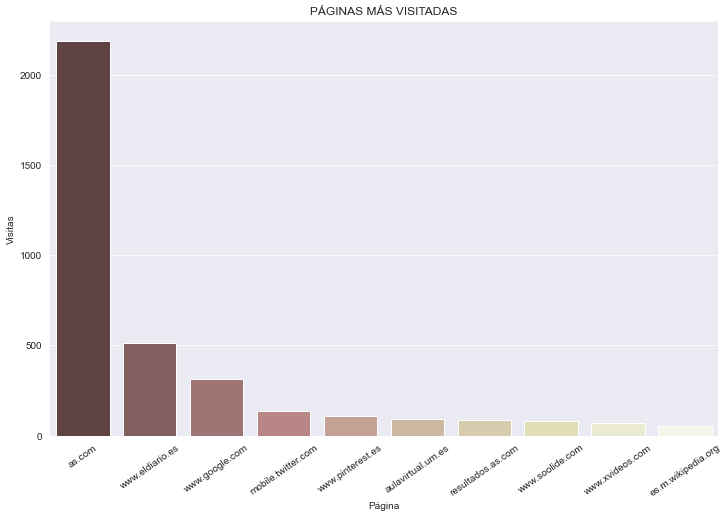

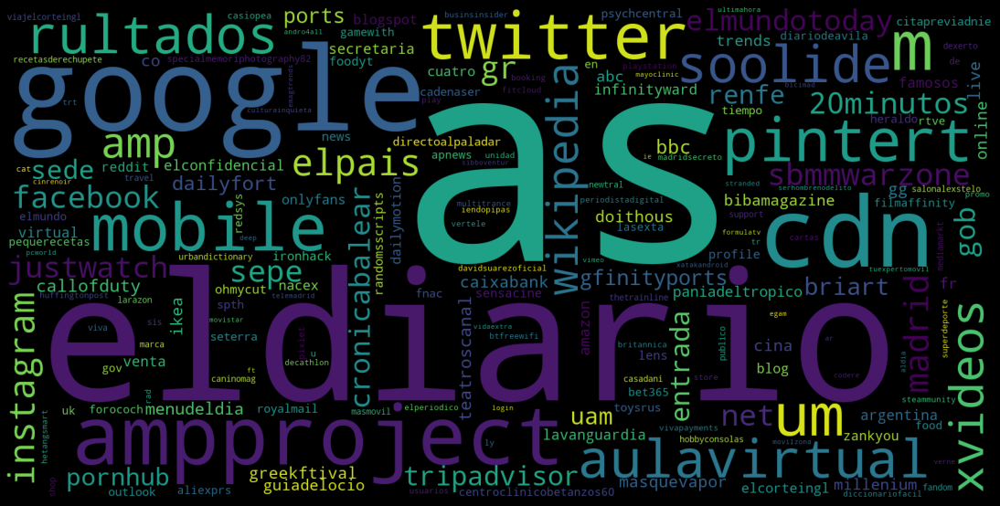

<ipython-input-1-ef41b9017114>:121: UserWarning:

Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access

2021-06-23 12:16:10.664 
  command:

    streamlit run /home/jbloch3/.local/lib/python3.8/site-packages/ipykernel_launcher.py [ARGUMENTS]


Hecho!


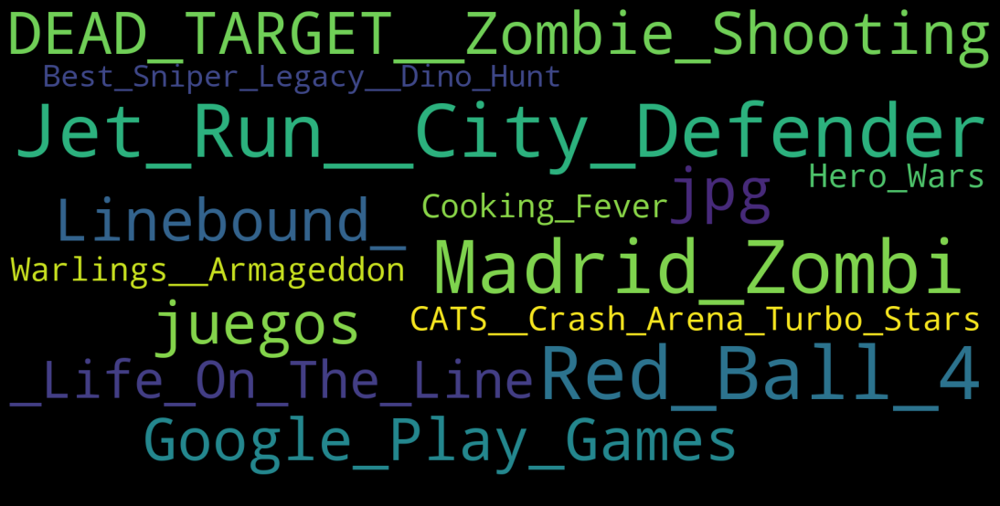

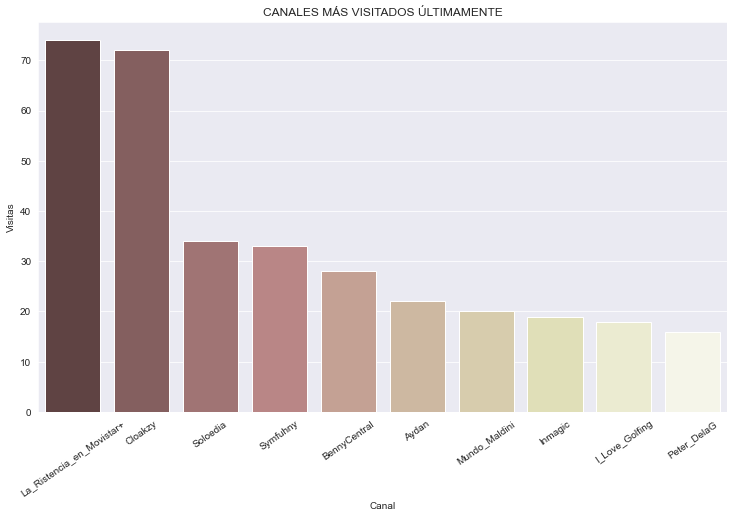

In [1]:
import os
import pandas as pd
import numpy as np

from wordcloud import WordCloud
from ipywidgets import interact
import cufflinks as cf
import chart_studio.plotly as py
import seaborn as sns
import matplotlib.pyplot as plt

from bs4 import BeautifulSoup as bs

import requests as req
from zipfile import ZipFile
import json
from pyquery import PyQuery

from PIL import Image

import folium
import folium.plugins
from folium.plugins import HeatMapWithTime as HMWT
from folium.plugins import HeatMap as HM
from folium.plugins import MarkerCluster


import streamlit as st

#!pip install utils
#!pip install xmltojson
#!pip install streamlit
#!pip install python-vlc
#!pip install pyquery

#%matplotlib inline
cf.go_offline()

archivos = os.listdir()
archivos_zip = []
for i in archivos:
    if i.endswith(".zip"):
        archivos_zip.append(i)
cwd = os.getcwd()
'''for i in archivos_zip:
    zf = ZipFile(i)
    zf.extractall()'''

os.chdir(cwd + '/' + 'Takeout')
Takeout_dir = os.getcwd()

f = open(Takeout_dir + '/' + 'Perfil' + '/'+'Perfil.json')
perfil_json = json.load(f)
nombre = perfil_json['name']['formattedName']
email = perfil_json['emails'][0]['value']

c = open(Takeout_dir + '/' + 'Chrome' + '/'+'BrowserHistory.json')
chrome_json = json.load(c)
df = pd.DataFrame(chrome_json['Browser History'])
for i in range(len(df.url)):
    if '//' in df.url[i]:
        df.url[i] = df.url[i].split('//')[1]

for i in range(len(df.url)):
    if '/' in df.url[i]:
        df.url[i] = df.url[i].split('/')[0]

Top10URL = df.url.value_counts()[0:10]
Top10URL_df = pd.DataFrame(Top10URL)
Top10URL_df_i= Top10URL_df.reset_index()
Top10URL_df_i = Top10URL_df_i.rename(columns={'index': 'Página', 'url': 'Visitas'})

plt.figure(figsize=(10, 7))
sns.set_style("darkgrid")
TopUrl = sns.barplot(data=Top10URL_df_i, x=Top10URL_df_i['Página'], y=Top10URL_df_i.Visitas, palette='pink').set_title('PÁGINAS MÁS VISITADAS')
plt.xticks(rotation=35)

plt.tight_layout(pad=0)

plt.savefig("TopUrl.png")

df['sopa'] = df.url.apply(lambda x: x.replace('com', '').replace('www', '').replace('es', '')
                           .replace('org', '').strip())

nadena = ['noapnc', 'oainnaci']
wordcloud = WordCloud(width=1600,height=800, stopwords=nadena, repeat= False, collocations=False).generate(' '.join([e for e in df.sopa]))

plt.figure(figsize=(15, 10), facecolor='k')
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.savefig('wordcloud.png', facecolor='k', bbox_inches='tight')
plt.show();

os. chdir('Servicios de Juegos de Google Play/Juegos/')
juegos = os.listdir()
juegos_df = pd.DataFrame(juegos)
juegos_df['limpio'] = juegos_df.apply(lambda x: x.replace(' ', '_'))
juegos_df['limpio'] = juegos_df['limpio'].apply(lambda x: x.replace(' ', '_'))

os. chdir(Takeout_dir)
wordcloud = WordCloud(width=1600,height=800, stopwords=nadena, repeat= False, collocations=False).generate(' '.join([e for e in juegos_df['limpio']]))

plt.figure(figsize=(15, 10), facecolor='k')
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.savefig('juegos.jpg', facecolor='k', bbox_inches='tight')

os. chdir(Takeout_dir)
r = open(Takeout_dir + '/' + 'Maps (Tus sitios)' +'/'+'Reseñas.json')
reseñas_json = json.load(r)

df_reseñas = pd.DataFrame(reseñas_json["features"])
df_reseñas1 = pd.json_normalize(df_reseñas['properties'])
df_reseñas1["Location.Geo Coordinates.Latitude"] = pd.to_numeric(df_reseñas1["Location.Geo Coordinates.Latitude"], downcast="float")
df_reseñas1['Location.Geo Coordinates.Longitude'] = pd.to_numeric(df_reseñas1['Location.Geo Coordinates.Longitude'], downcast="float")

media_reseñas = df_reseñas1['Star Rating'].mean()

df_reseñas1.ubica=df_reseñas1[['Location.Geo Coordinates.Latitude', 'Location.Geo Coordinates.Longitude']].values

m = folium.Map(location=df_reseñas1.ubica[0], zoom_start=12, tiles="Stamen Terrain")
colores = {1:'red', 2:'orange', 3:'yellow', 4:'darkgreen', 5:'green' }
for i in range(len(df_reseñas1)):
    folium.Marker(
        location= [df_reseñas1.ubica[i][0], df_reseñas1.ubica[i][1]],
        popup=df_reseñas1['Location.Business Name'][i] +' (' + str(df_reseñas1['Star Rating'][i]) + ')',
        icon=folium.Icon(color=colores[df_reseñas1['Star Rating'][i]], icon='check', prefix='fa'),
    ).add_to(m)

os. chdir('Google Play Libros')
libros = os.listdir()


os. chdir(Takeout_dir)
p = open(Takeout_dir + '/' + 'Google Play Películas' +'/'+'Puntuaciones.json')
peliculas_json = json.load(p)
df_peliculas = pd.DataFrame(peliculas_json['ratings'])

html = open(Takeout_dir + '/YouTube y YouTube Music/historial/historial-de-reproducciones.html', 'r').read() # local html

query = PyQuery(html)
lst= []
for i in range(2000):
    try:
        lst.append(query("a").eq(i).text())
    except:
        break

youtube = pd.DataFrame(lst)
youtube
youtube[0] = youtube[0].apply(lambda x: x.replace(' ', '_').replace('com', '').replace('www', '').replace('es', '')
                           .replace('org', '').replace('https', '').strip())
canales = youtube.value_counts()[0:10]
TopCanales_df = pd.DataFrame(canales, columns= ['Visitas'])
TopCanales_df_i= TopCanales_df.reset_index()
TopCanales_df_i = TopCanales_df_i.rename(columns={0: 'Canal'})

plt.figure(figsize=(10, 7))
sns.set_style("darkgrid")
YTcanales = sns.barplot(data=Top10URL_df_i, x=TopCanales_df_i['Canal'], y=TopCanales_df_i.Visitas, palette='pink').set_title('CANALES MÁS VISITADOS ÚLTIMAMENTE')
plt.xticks(rotation=35)
plt.tight_layout(pad=0)
plt.savefig("YTcanales.png")

os.chdir(Takeout_dir + '/' + 'Mi actividad' +'/'+'Voz y Audio')
audios = os.listdir()
os.chdir(Takeout_dir)

ind = np.random.randint(0,len(audios))
import vlc
p = vlc.MediaPlayer(Takeout_dir + '/' + 'Mi actividad' +'/'+'Voz y Audio' + '/'+ audios[ind])
p.play()

os.chdir(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History')
años = os.listdir()
x = open(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History/2016/2016_OCTOBER.json')
prueba_json = json.load(x)

lst= []
for i in años:
    os.chdir(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History/' + i)
    meses = os.listdir()   
    for j in meses:
        x = open(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History/'+i+'/'+ j)
        prueba_json = json.load(x)
        for k in range(len(prueba_json['timelineObjects'])):
            try:
                lst.append((prueba_json['timelineObjects'][k]['placeVisit']['location']['latitudeE7'], prueba_json['timelineObjects'][k]['placeVisit']['location']['longitudeE7'], j))
            except:
                pass

df_loc = pd.DataFrame(lst, columns = ['lat', 'lon', 'date'])
df_loc['lat'] = df_loc['lat'].apply(lambda x: x / 10000000)
df_loc['lon'] = df_loc['lon'].apply(lambda x: x / 10000000)

df_loc['date'] = df_loc['date'].apply(lambda x: x.replace('_',' ').replace('.json', ''))
df_loc['date'] = pd.to_datetime(df_loc['date'])
df_loc['month']=df_loc['date'].apply(lambda x: x.month)
df_loc['year']=df_loc['date'].apply(lambda x: x.year)

l = folium.Map(location=df_reseñas1.ubica[0], zoom_start=3, tiles="Stamen Terrain")

marker_cluster = MarkerCluster().add_to(l)

for i in range(len(df_loc)):
    folium.Marker(
        location= [df_loc.lat[i], df_loc.lon[i]],
        popup=df_loc.date[i],
        icon=folium.Icon(color='green', icon='check', prefix='fa'),
    ).add_to(marker_cluster)

os.chdir(cwd)

st.write("""
#Tu Google Takeout 
""")

st.text('Hola' + nombre + '''En esta nueva era en la que vivimos, los datos son el nuevo petroleo.
 La información es poder y de alguna forma la información que tienen las grandes empresas sobre 
 nosotros es poder sobre nosotros. Veamos algunas de las cosas que sabe Google sobre ti: ''')

st.write("""
## Google conoce las páginas que visitas... 
""")

col1, col2 = st.beta_columns(2)
with col1:
    imagen = Image.open("Takeout/TopUrl.png")
    st.image(imagen, use_column_width=True)
with col2:
    imagen = Image.open("Takeout/wordcloud.png")
    st.image(imagen, use_column_width=True)

st.write("""
## Sabe lo que te gusta ver en YouTube... 
""")

imagen = Image.open("Takeout/YTcanales.png")
st.image(imagen, use_column_width=True)

st.write("""
## Sabe a que juegas... 
""")
imagen = Image.open("Takeout/juegos.jpg")
st.image(imagen, use_column_width=True)

print('Hecho!')

In [ ]:
st.write("""
#Tu Google Takeout 
""")

st.text('Hola' + nombre + '''En esta nueva era en la que vivimos, los datos son el nuevo petroleo.
 La información es poder y de alguna forma la información que tienen las grandes empresas sobre 
 nosotros es poder sobre nosotros. Veamos algunas de las cosas que sabe Google sobre ti: ''')

st.write("""
## Google conoce las páginas que visitas... 
""")

col1, col2 = st.beta_columns(2)
with col1:
    imagen = Image.open("Takeout/TopUrl.png")
    st.image(imagen, use_column_width=True)
with col2:
    imagen = Image.open("Takeout/wordcloud.png")
    st.image(imagen, use_column_width=True)

st.write("""
## Sabe lo que te gusta ver en YouTube... 
""")

imagen = Image.open("Takeout/YTcanales.png")
st.image(imagen, use_column_width=True)

st.write("""
## Sabe a que juegas... 
""")
imagen = Image.open("Takeout/juegos.jpg")
st.image(imagen, use_column_width=True)

print('Hecho!')

In [3]:
st.write("""
## Google conoce las páginas que visitas... 
""")

In [ ]:
!streamlit run /home/jbloch3/.local/lib/python3.8/site-packages/ipykernel_launcher.py 


  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://10.0.4.96:8501

[IPKernelApp] ERROR | Unable to initialize signal:
Traceback (most recent call last):
  File "/home/jbloch3/.local/lib/python3.8/site-packages/ipykernel/kernelapp.py", line 576, in initialize
    self.init_signal()
  File "/home/jbloch3/.local/lib/python3.8/site-packages/ipykernel/kernelapp.py", line 435, in init_signal
    signal.signal(signal.SIGINT, signal.SIG_IGN)
  File "/usr/lib/python3.8/signal.py", line 47, in signal
    handler = _signal.signal(_enum_to_int(signalnum), _enum_to_int(handler))
ValueError: signal only works in main thread
